<a href="https://colab.research.google.com/github/Camilojaravila/202310_MINE-4206_ANALISIS_CON_MACHINE_LEARNING/blob/main/Laboratorio%201/Taller%201.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

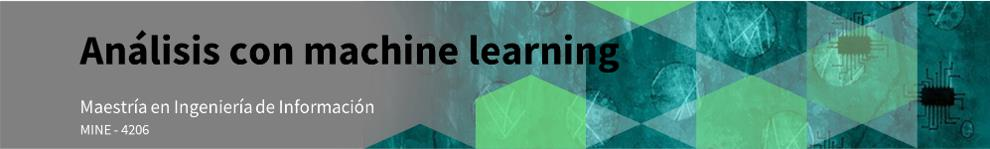

- **Integrante 1: Julián Sanabria Mejia**
- **Integrante 2: Iván Saavedra Villamil**
- **Integrante 3: Julián Barreto Mora**

En la actualidad, el sector inmobiliario está en pleno auge. Ofrece muchas oportunidades emocionantes y un alto rendimiento en cuanto a estilos de vida e inversiones. El mercado inmobiliario lleva varios años en fase de crecimiento, lo que significa que todavía se pueden encontrar propiedades a precios muy atractivos, pero es muy probable que aumenten en el futuro.
Para poder entender el mercado, una inmobiliaria rusa le ha brindado la información de la venta de más de 28 mil inmuebles entre los años de 2018 y 2021. Y quieren entender cuáles son las características principales que inciden en los precios de venta, para poder proponer planes de construcción de inmuebles en las áreas urbanas disponibles, que tomen en cuenta estas características.

Para poder tomar decisiones en este estudio, se debe presentar:

* Una tabla comparativa, mostrando el rendimiento los tres mejores modelos entrenados con regresión polinomial, ridge y lasso.

* Un análisis de las variables que se consideraron importantes en la predicción con base en el modelo lasso.

* A partir de la tabla comparativa, ¿cuál modelo ofrece el mejor rendimiento sobre el conjunto test? ¿Qué interpretación puedes darles a los valores obtenidos sobre las métricas de rendimiento?

* ¿Cuáles variables fueron seleccionadas con el modelo Lasso? A partir de estas, ¿qué interpretación de cara al problema puedes dar? Reflexiona sobre cómo este nuevo conocimiento podría ayudar a tomar decisiones en el contexto del problema.

**Datos**: AirbnbRJRentals.csv

## Diccionario de Datos

La inmobiliaria, le ha construido el siguiente diccionario de datos:

**id**: Airbnb's unique identifier for the listing.

**name**: Name of the listing.

**host_id**: Airbnb's unique identifier for the host/user.

**host_name**: Name of the host. Usually just the first name(s).

**neighbourhood**: neighbourhood.

**latitude**: Uses the World Geodetic System (WGS84) projection for latitude and longitude.

**longitude**: Uses the World Geodetic System (WGS84) projection for latitude and longitude.

**room_type**: "[Entire home/apt|Private room|Shared room|Hotel] All homes are grouped into the following three room types: Entire place Private room Shared room Entire place Entire places are best if you're seeking a home away from home. With an entire place, you'll have the whole space to yourself. This usually includes a bedroom, a bathroom, a kitchen, and a separate, dedicated entrance. Hosts should note in the description if they'll be on the property or not (ex: ""Host occupies first floor of the home""), and provide further details on the listing. Private rooms Private rooms are great for when you prefer a little privacy, and still value a local connection. When you book a private room, you'll have your own private room for sleeping and may share some spaces with others. You might need to walk through indoor spaces that another host or guest may occupy to get to your room. Shared rooms Shared rooms are for when you don't mind sharing a space with others. When you book a shared room, you'll be sleeping in a space that is shared with others and share the entire space with other people. Shared rooms are popular among flexible travelers looking for new friends and budget-friendly stays."

**price**: daily price in local currency

**minimum_nights**: minimum number of night stay for the listing (calendar rules may be 
different)

**number_of_reviews**: The number of reviews the listing has

**last_review**: The date of the last/newest review

**reviews_per_month**: The number of reviews the listing has over the lifetime of the listing

**calculated_host_listings_count**: The number of listings the host has in the current scrape, in the city/region geography.

**availability_365**: avaliability_x. The availability of the listing x days in the future as determined by the calendar. Note a listing may not be available because it has been booked by a guest or blocked by the host.

**number_of_reviews_ltm**: The number of reviews the listing has (in the last 12 months)

## 0. Importación de Librerías.

In [1]:
pip install ydata-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 344.5/344.5 KB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 73.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 KB 42.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 65.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 KB 17.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=c8d7d6cd16b961764db63ace80b91f400f203e50a0c55f2572b164b4d36d7aaf
  Stored in directory: /root/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
Successfully built htmlmin
  Attempting uninstall: typeguard
    Found existing installation: typeguard 2.7.1
    Unin

In [2]:
#Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Analisis profundo de datos
from pandas_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer, make_column_selector

#Librerías extras
import itertools

<ipython-input-2-55135f4bdb58>:11: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


## 1. Entendimiento del Negocio

Pensamos que el planteamiento del problema no concuerda con los datos suministrados.

En el planteamiento del problema, una inmolbilaria de Rusia busca las características principales que inciden en los precios de venta de propiedades. Sin embargo, los datos suministrados corresponden a AirBnN, una empresa que renta propiedades y los datos compartidos correponden puntalmente a la ciudad de Rio de Janerio en Brasil.

Por lo tanto, para este taller tomamos la decisión de buscar las características principales que inciden en los precios de alquiler de las propiedades.

## 2. Entendimiento de los Datos

In [4]:
url = '/content/AirbnbRJRentals.csv'
data = pd.read_csv(url)
data.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,10463735,Sobrado aconchegante e espaçoso,53918534,Quiá,Laranjeiras,-22.93555,-43.191070,Entire home/apt,581,1,2,2018-02-14,0.03,6,181,0
1,53887789,Quadra da praia,333527901,Lucas,Copacabana,-22.97032,-43.180810,Entire home/apt,898,5,0,NaN,NaN,2,365,0
2,783493769216852616,"Leme, Brasil",491704706,Felipe,Leme,-22.96421,-43.171600,Entire home/apt,720,1,0,NaN,NaN,2,362,0
3,703973293620197060,Suíte com entrada independente em casarão 1,20362236,Júlio Cesar,Botafogo,-22.95792,-43.182226,Private room,599,4,1,2022-09-06,0.26,4,363,1
4,782895997622988215,Apartamento próximo ao metrô,302417043,Laís,Laranjeiras,-22.93196,-43.180180,Entire home/apt,240,3,0,NaN,NaN,1,160,0


In [5]:
train, test = train_test_split(data, test_size=0.2, random_state=33)
train.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
22393,751596214666249084,Flat com vista privilegiada,67587712,Gabriel,Barra da Tijuca,-23.00347,-43.34083,Entire home/apt,508,1,1,2022-12-10,1.00,17,72,1
15624,10896807,Charming room/silent in Copacabana,56467953,Virginia,Copacabana,-22.98640,-43.19060,Private room,350,5,11,2020-02-28,0.14,1,358,0
20846,45434652,Área de piscina e churrasqueira SEM PERNOITE.,18411711,Mauro,Santa Teresa,-22.94032,-43.20616,Entire home/apt,1029,1,51,2022-12-17,2.39,1,348,25
4904,52988757,Apartamento acochegante na melhor localização ...,428975458,Maria Sirlane,Copacabana,-22.97216,-43.18777,Entire home/apt,320,7,2,2022-04-11,0.20,1,85,2
8881,42929496,Velinn Reserva Copacabana - Quarto Junior com ...,40544028,Rede Reserva,Copacabana,-22.98350,-43.19347,Private room,738,1,27,2022-11-23,1.00,4,295,15


In [6]:
# Análisis exploratio de datos
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Luego de realizar el análisis exploratorio de datos se tomaron las siguientes decisiones:

1- No utilizar los campos id, name, host_id y host_name, ya que no aportan al modelo al tratar de identificares únicos y nombre propios de las propiedades y sus arrendatarios.

2- La variable objetivo será el campo price, el precio de alquiler por día para una propiedad.

3- Tampoco se hará uso de los campos last_review y reviews_per_mont por la cantidad de valores faltantes.

4- El campos number_of_reviews_ltm se encuentra altamente correlacionado (0.856) con el campo number_of_reviews, por tanto, tampoco se hará uso de él.

## 3. Preparación de los datos

In [7]:
# División conjunto de entrenamiento y conjunto de validación
train_m, val = train_test_split(train, test_size=0.2, random_state=33)
train_m.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
28276,43456749,Lindo apartamento na praia do Recreio,325906623,Vagner,Recreio dos Bandeirantes,-23.02788,-43.47127,Entire home/apt,2300,1,0,NaN,NaN,1,365,0
5493,41235265,"VISTA FRONTAL TOTAL, 3QTS. AMZN SEA VIEW, 3BDR.",35082628,Bruno,Copacabana,-22.97149,-43.18440,Entire home/apt,2514,4,72,2022-12-11,2.03,2,301,24
2145,8499916,MAR ABERTO - PENAMRIO,27149197,Maria Luisa,Copacabana,-22.98211,-43.18945,Entire home/apt,1196,4,89,2022-12-25,1.03,9,11,41
20161,29185228,"Villagio, Loft Deluxe 1 Barra da Tijuca",214303727,Villagio,Barra da Tijuca,-23.00155,-43.30805,Entire home/apt,264,4,34,2022-12-11,0.67,3,353,15
20823,14089841,Apartamento prox ao Maracana,84161763,Ierece,Andaraí,-22.91916,-43.24904,Entire home/apt,500,2,0,NaN,NaN,1,362,0


In [8]:
# Separación variable objetivos y características que van a ser utilizadas en el modelo
X_train, y_train = train_m.drop(['id','name','host_id','host_name','price','last_review','reviews_per_month','number_of_reviews_ltm'],axis=1), train_m['price'] 
display(X_train)
y_train

,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
28276,Recreio dos Bandeirantes,-23.02788,-43.47127,Entire home/apt,1,0,1,365
5493,Copacabana,-22.97149,-43.18440,Entire home/apt,4,72,2,301
2145,Copacabana,-22.98211,-43.18945,Entire home/apt,4,89,9,11
20161,Barra da Tijuca,-23.00155,-43.30805,Entire home/apt,4,34,3,353
20823,Andaraí,-22.91916,-43.24904,Entire home/apt,2,0,1,362
...,...,...,...,...,...,...,...,...
5104,Santa Teresa,-22.92879,-43.19474,Private room,1,70,6,295
10765,Barra da Tijuca,-23.00399,-43.34816,Entire home/apt,4,0,1,362
1641,Flamengo,-22.93853,-43.17559,Entire home/apt,5,20,4,348
15657,Copacabana,-22.97978,-43.19021,Entire home/apt,3,30,1,40


28276    2300
5493     2514
2145     1196
20161     264
20823     500
         ... 
5104      190
10765     802
1641      714
15657     827
20697     570
Name: price, Length: 18112, dtype: int64

## 4. Modelamiento

### 4.1. Regresión Polinomial

In [ ]:
preprocessor_Poly = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(),  make_column_selector(dtype_include=np.number)),
        ("cat", OneHotEncoder(), make_column_selector(dtype_include=object)),
    ]
)

estimators_Poly = [
        ('transformar',preprocessor_Poly),
        ('polinomial',PolynomialFeatures()) 
    ]

pipe_Poly = Pipeline(estimators_Poly)

parameters_Poly = {
              'polinomial__degree':[1,2,3,4,5],
              'transformar__num': [StandardScaler(), MinMaxScaler(), 'passthrough'],
              'transformar__cat': [OneHotEncoder(handle_unknown='ignore'), OrdinalEncoder(handle_unknown='use_encoded_value')]
              }

grid_search_Poly = GridSearchCV(pipe_Poly, parameters_Poly, verbose=2, scoring='neg_mean_squared_error', cv=5)


In [ ]:
%%time
grid_search_Poly.fit(X_train,y_train)

In [ ]:
best_model_Poly = grid_search_Poly.best_estimator_

pd.DataFrame(grid_search_Poly.cv_results_)

In [ ]:
grid_search_Poly.best_params_

### 4.2. Regresión Ridge

In [9]:
preprocessor_Ridge = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(),  make_column_selector(dtype_include=np.number)),
        ("cat", OneHotEncoder(), make_column_selector(dtype_include=object)),
    ]
)

estimators_Ridge = [
        ('transformar',preprocessor_Ridge),
        ('polinomial',PolynomialFeatures()),
        ('regresion', Ridge()) 
    ]

pipe_Ridge = Pipeline(estimators_Ridge)

parameters_Ridge = {
              'polinomial__degree':[1,2,3,4],
              'regresion__alpha': [0.01, 0.1, 1, 10, 100],
              'transformar__num': [StandardScaler(), MinMaxScaler(), 'passthrough'],
              'transformar__cat': [OneHotEncoder(handle_unknown='ignore'), OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=0)]
              }

grid_search_Ridge = GridSearchCV(pipe_Ridge, parameters_Ridge, verbose=2, scoring='neg_mean_squared_error', cv=5)



In [11]:
%%time
grid_search_Ridge.fit(X_train,y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV] END polinomial__degree=1, regresion__alpha=0.01, transformar__cat=OneHotEncoder(handle_unknown='ignore'), transformar__num=StandardScaler(); total time=   0.1s
[CV] END polinomial__degree=1, regresion__alpha=0.01, transformar__cat=OneHotEncoder(handle_unknown='ignore'), transformar__num=StandardScaler(); total time=   0.1s
[CV] END polinomial__degree=1, regresion__alpha=0.01, transformar__cat=OneHotEncoder(handle_unknown='ignore'), transformar__num=StandardScaler(); total time=   0.1s
[CV] END polinomial__degree=1, regresion__alpha=0.01, transformar__cat=OneHotEncoder(handle_unknown='ignore'), transformar__num=StandardScaler(); total time=   0.1s
[CV] END polinomial__degree=1, regresion__alpha=0.01, transformar__cat=OneHotEncoder(handle_unknown='ignore'), transformar__num=StandardScaler(); total time=   0.1s
[CV] END polinomial__degree=1, regresion__alpha=0.01, transformar__cat=OneHotEncoder(handle_unknown='ignore'), t

KeyboardInterrupt: ignored

In [ ]:
best_model_Poly = grid_search_Poly.best_estimator_

pd.DataFrame(grid_search_Poly.cv_results_)

### 4.3. Regresión Lasso

In [ ]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(),  make_column_selector(dtype_include=np.number)),
        ("cat", OneHotEncoder(), make_column_selector(dtype_include=object)),
    ]
)

estimators = [
        ('transformar',preprocessor),
        ('polinomial',PolynomialFeatures()),
        ('regresion', Lasso()) 
    ]

pipe = Pipeline(estimators)

parameters = {
              'polinomial__degree':[2,3],
              'regresion__alpha': [0.01, 0.1, 1, 10, 100],
              'transformar__num': [StandardScaler(), MinMaxScaler(), 'passthrough'],
              'transformar__cat': [OneHotEncoder(handle_unknown='ignore'), OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=0)]
              }

grid_search = GridSearchCV(pipe, parameters, verbose=2, scoring='neg_mean_squared_error', cv=5)